# 🐶🦮 End-to-end Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.15 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a dog given the image of a dog.

When I'm sitting at the cafe and I take a photo of a dog , I wanna know what breed of dog it is .

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview

## 4. Features

Some information about the data :
* We're dealing with images (unstructured data) so it's probably best if we used deep learning / transfer learning .
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set ( these images have no labels , because we want to predict them).

In [ ]:
#Unzipping the uploaded data into google drive
#!unzip "drive/MyDrive/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

### Getting our Workspace ready

* Import TensorFlow 2.x ( already comes pre-imported) ✅
* Import TensorFlow Hub ✅
* Making sure we're using a GPU ✅

In [ ]:
# Import TensorFlow into Colab and checking its version
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("TF_Hub version:",hub.__version__)

# Check for GPU availability
print("GPU","available (YESSSSS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
TF_Hub version: 0.16.1
GPU not available :(


## Getting our Data ready (turning it into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation).

Let's start accessing our data and checking out the labels.

In [ ]:
#Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

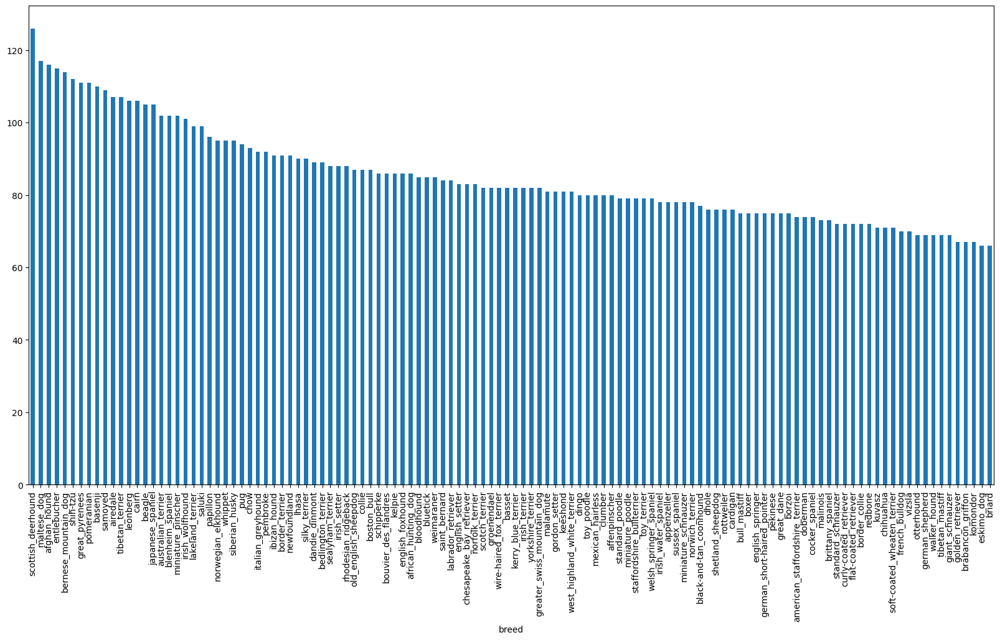

In [ ]:
# How many images are there of each breed ?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

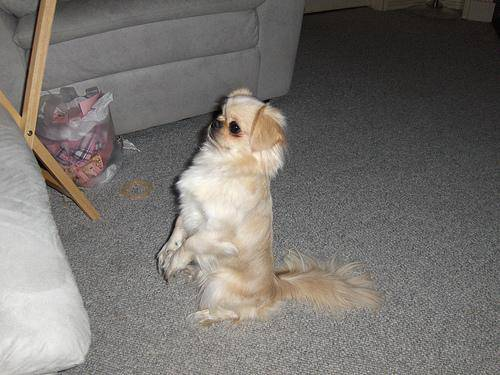

In [ ]:
#Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### Getting Images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
# Create pathnames for Image Id's
filenames = ["drive/MyDrive/Dog Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]] #Here , we are creating a list which includes all the values of the id column from labels_csv
filenames [:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Checking whether the number of filenames matches the number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames): #This checks the files in the directory and compares whether their number is equal to that of filenames
  print ("Filenames match actual amount of files !! Proceed.")
else:
  print("Filenames do not match the actual number of files, check the target directory.")

Filenames match actual amount of files !! Proceed.


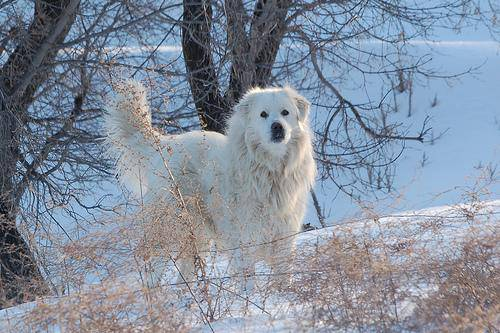

In [ ]:
#One more check
Image(filenames[6666])

In [ ]:
labels_csv["breed"][6666]

'great_pyrenees'

Since we've now got our training image filepaths into a list , let's prepare our labels .

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches with number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames !")
else:
  print("Number of labels do not match the number of filenames, check the directory !")

Number of labels matches the number of filenames !


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
#Turn a single label into an array of booleans
print(labels[0])
#Check the labels array and the unique_breeds array , from there the position at which 0th position dog breed is stated in labels , is compared to the
#position where it is stated in unique_breeds array , and only that location gives true value , others are false
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turning every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels] #This is just doing what we did above to all the labels
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example : Turning Boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) #This gives the index where this label occurs
print(boolean_labels[0].argmax()) #This gives the index where the label occurs in the boolean array
print(boolean_labels[0].astype(int)) #There should be a 1 , where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# Doing the same for another one
print(labels[69])
print(boolean_labels[69].astype(int)) #There should be a 1 , where the sample label occurs

bloodhound
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own Validation Set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size = 0.2,
                                               random_state=69)

# Checking whether our data is in the right shape or not
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a gaze at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/0d68c98ac13f84032cb863abf0498a02.jpg',
  'drive/MyDrive/Dog Vision/train/0825e8471e3c9a14dc341bdd8630f05e.jpg',
  'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
  'drive/MyDrive/Dog Vision/train/01d0f3692e576b3cde511285352aed4a.jpg',
  'drive/MyDrive/Dog Vision/train/0a077ea0c8fa54d95f75e690b2c8196b.jpg'],
 [array([False, False, False,  True, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into Tensors)

To preprocess our Images into Tensors we're going to write a function which does a few things :
1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

Before we do , let's see what importing an image looks like.

In [ ]:
# Convert an image to a Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42]) #This filename number 42 is random
image.shape # the shape is like (height, width, colour channel(RGB))

(257, 350, 3)

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
#Turning images into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to process them.

1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red,Green,Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel value from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size =[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches ?

Let's say we're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (we can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor Tuples which look like this : `(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image , label)
def get_image_label(image_path, label):
  """
  Takes an image file path and the associated label,
  processes the image and returns a tuple of (image,label).
  """

  image = process_image(image_path)
  return image,label

In [ ]:
# Demo of the above
(process_image(X[69]),tf.constant(y[69])) # The tf.constant converts the labels(y) into tensors

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[1.44335870e-02, 1.83551554e-02, 3.20331287e-03],
         [1.37881711e-02, 1.77097414e-02, 3.38901114e-03],
         [2.08912752e-04, 4.13048128e-03, 0.00000000e+00],
         ...,
         [1.17647070e-02, 1.17647070e-02, 1.17647070e-02],
         [1.82860643e-02, 1.82860643e-02, 1.82860643e-02],
         [1.82860643e-02, 1.82860643e-02, 1.82860643e-02]],
 
        [[1.20994570e-02, 1.60210263e-02, 2.04762258e-03],
         [7.37413415e-04, 4.65898216e-03, 5.18573157e-04],
         [1.90108884e-02, 2.29324568e-02, 6.49486494e-04],
         ...,
         [1.21200671e-02, 1.21200671e-02, 1.21200671e-02],
         [1.17209386e-02, 1.17209386e-02, 1.17209386e-02],
         [1.17209386e-02, 1.17209386e-02, 1.17209386e-02]],
 
        [[1.10203698e-01, 1.08750626e-01, 8.79085362e-02],
         [1.20225832e-01, 1.18772760e-01, 9.79306698e-02],
         [1.13384195e-01, 1.11931115e-01, 9.10890251e-02],
         ...,
         [1

Now we've got a way to turn our data into tuples of Tensors in the form: `(image,label)` , let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
# Define the batch size , 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if its training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (which has no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data btaches... ")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset , we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                              tf.constant(y)))  # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels to tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of the data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches , however these can be a little bit hard to understand/comprehend, let's visualize them !

In [ ]:
import matplotlib.pyplot as plt
# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  fig = plt.figure(figsize=(10,10))
  # Loop through 25 ( for displaying the 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = fig.add_subplot(5, 5, i+1)       #(rows,columns,index)
    # Display an image
    plt.imshow(images[i])
    # Add the image labels as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the gridlines off
    plt.axis("off")

So the next line of code would take a batch dataset , it would unwind the data from the batch and convert it into a numpy iterator.

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.05866597, 0.05866597, 0.02729342],
          [0.05204465, 0.04027994, 0.01282896],
          [0.04852067, 0.0361257 , 0.00898985],
          ...,
          [0.12055649, 0.0813408 , 0.03428197],
          [0.08412261, 0.05394061, 0.01020808],
          [0.10369924, 0.08016982, 0.03311099]],
 
         [[0.0474965 , 0.0474965 , 0.01612395],
          [0.04908089, 0.03731618, 0.0098652 ],
          [0.0541054 , 0.04171044, 0.01457458],
          ...,
          [0.11781345, 0.07859776, 0.03153893],
          [0.14251766, 0.11195697, 0.06898182],
          [0.13076997, 0.10474581, 0.06267647]],
 
         [[0.03897934, 0.03897934, 0.00760679],
          [0.05038516, 0.03862045, 0.01116947],
          [0.05551323, 0.04311826, 0.01598241],
          ...,
          [0.11587316, 0.07665747, 0.02959864],
          [0.06877882, 0.03460349, 0.00250695],
          [0.06334997, 0.0354263 , 0.00429009]],
 
         ...,
 
         [[0.5827191 , 0.4376211 , 0.22948685],
          [0.57939

In [ ]:
len(train_images), len(train_labels)

(32, 32)

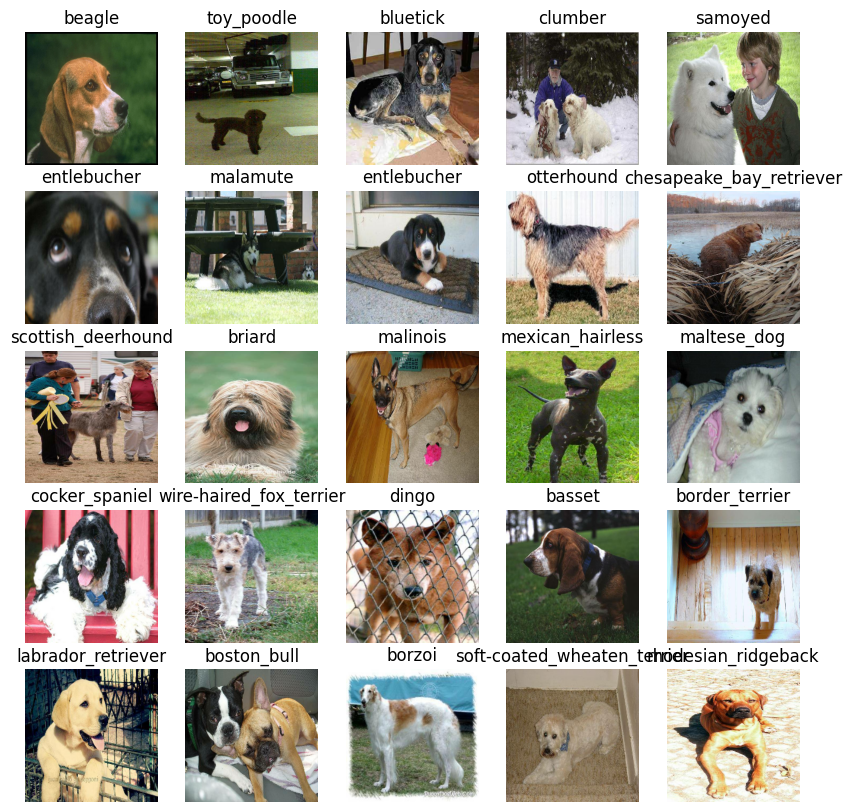

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator()) #This also shuffles the images in the train batch
show_25_images(train_images, train_labels)

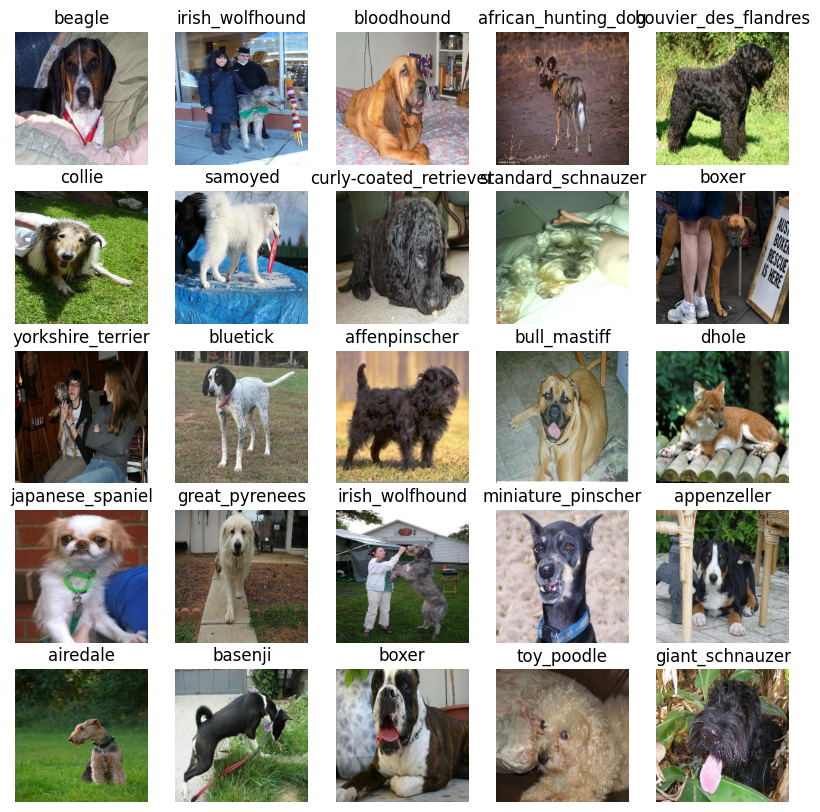

In [ ]:
# Now let's visualize the validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model

Before we build a model, there are a few things we need to define :
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from Tensorflow Hub - https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true (now Kaggle).

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch,height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensroflow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true"

Now we've got our inputs, outputs and models ready to go.
Let's put them together into a Keras deep learning model !

Knowing this , let's create a function which:
* Takes the input shape , output shape and the model we have chosen as parameters.
* Defines the layers of the model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it would be getting).
* Return the model.

All of these steps can be found here : https://www.tensorflow.org/guide/keras


In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),    # Layer 1 (input layer)

      # The above piece of code represents that once the model has gone through the mobilenet_v2 architecture , it outputs a single array of size 1280 with all of the patterns
      # it has learned from the images

      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")  # Layer 2 (output layer)

      # The above piece of code represents that we don't want an array of size 1280 , rather we want 120 (as it is unique breeds size) , and we use softmax to represent all the
      # array elements as float no. between 0 & 1 (and all of them together add up to 1 , since they are denoted as probability distribution)

  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]

      # The above piece of code has a loss function that determines how well our model is guessing (the lower the loss value , the better is the function ) .
      # The optimizer function is one that helps our model to improve its guesses.
      # The metric , which is the way of evaluating those guesses after the model has learnt.
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In the above output of the model summary we see that there are certain trainable & non-trainable parameters . The Non-trainable parameters are the ones on which the mobilenet_v2 model was initially trained on and figured out certain patterens within them. The trainable parameters are the ones on which we are gonna train our models. As we are using Transfer Learning , hence this becomes possible and we can use a model that has already trained on certain data to predict on further data (here images)

In [ ]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check it's progress or stop training early if a model stops improving.

We'll create two callbacks , one for TensorBoard (dashboard to see how a model is doing ) which helps to track our model progress and another for early stopping which prevents our model from trainig for too long.

### TensorBoard Callback

To setup a TensorBoard callback we need to do 3 things :
1. Load the TensorBoard extension ✅
2. Create a Tensorboard callback which is able to save logs to a directory and pass it to our odel's `fit()` function.✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training ).

In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%HM%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model ( on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on GPU
print("GPU","available (YESSSSSSSSS!)" if tf.config.list_physical_devices("GPU") else "not available :( ")

GPU not available :( 


### Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model , passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version .
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true
Epoch 1/100
25/25 [==============================] - 265s 9s/step - loss: 4.5420 - accuracy: 0.1025 - val_loss: 3.4973 - val_accuracy: 0.1950
Epoch 2/100
25/25 [==============================] - 66s 3s/step - loss: 1.5887 - accuracy: 0.6988 - val_loss: 2.2105 - val_accuracy: 0.4350
Epoch 3/100
25/25 [==============================] - 56s 2s/step - loss: 0.5467 - accuracy: 0.9350 - val_loss: 1.6957 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 65s 3s/step - loss: 0.2455 - accuracy: 0.9887 - val_loss: 1.4973 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 55s 2s/step - loss: 0.1430 - accuracy: 0.9975 - val_loss: 1.4372 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 64s 3s/step - loss: 0.0968 - accuracy: 0.9987 - val_loss: 1.3677 - val_accuracy: 0.6100
Epoch 7/100
25/25 [======

**Question:** It looks like our model is overfitting because it is performing far better on the training dataset than the validation dataset , what are some ways to prevent model overfitting in deep learning neural networks ?

https://machinelearningmastery.com/introduction-to-regularization-to-reduce-overfitting-and-improve-generalization-error/

The above website provides us with the answer of the question

**Note:** Overfitting to begin with is a good thing! It means our model is learning !!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

In the above code block where we wanted to view the tensorboard , we didn't use string format but rather wrote it just like we could in conda command shells.

Note that, the spaces are denoted by a '\' first then the space is applied.

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 13s 2s/step


array([[8.8732755e-05, 1.6999920e-03, 3.9853730e-05, ..., 2.3648981e-04,
        9.9951902e-04, 7.9510896e-04],
       [1.7969243e-05, 4.8327415e-06, 1.9808685e-05, ..., 1.2856180e-05,
        4.9966743e-04, 3.6795565e-05],
       [2.1765272e-06, 3.2492602e-04, 4.1874673e-06, ..., 1.7062484e-05,
        3.7865211e-05, 3.4123164e-05],
       ...,
       [1.6384950e-02, 2.1225419e-06, 3.2688698e-05, ..., 5.9429913e-06,
        2.7377296e-06, 4.8918846e-05],
       [1.9656145e-05, 2.5454060e-06, 5.5128467e-06, ..., 5.2985317e-05,
        1.0160842e-06, 1.9066648e-06],
       [4.5567940e-04, 4.5269913e-05, 1.6511312e-06, ..., 3.4291303e-04,
        8.1566238e-04, 6.7262095e-04]], dtype=float32)

In [ ]:
predictions[0]

array([8.87327551e-05, 1.69999199e-03, 3.98537304e-05, 1.97430403e-04,
       3.29302566e-04, 1.27009535e-03, 1.62764245e-05, 6.37796533e-04,
       4.91210744e-02, 1.18650161e-02, 2.40288238e-04, 4.47139639e-04,
       8.14019609e-03, 8.18484259e-05, 1.69924565e-03, 1.08150649e-03,
       3.31708907e-05, 2.23776835e-04, 1.79075505e-05, 8.90539261e-04,
       2.43955747e-05, 4.31217579e-03, 6.56258726e-06, 2.21833048e-04,
       4.72353742e-04, 2.03456380e-04, 6.85134291e-05, 4.51411179e-05,
       8.46733747e-06, 4.47605744e-05, 1.67500912e-06, 1.08031374e-04,
       2.13570383e-05, 3.25486726e-05, 1.18364387e-05, 6.44338434e-05,
       1.44005229e-04, 9.90654153e-05, 1.71088171e-03, 1.17157353e-02,
       1.45398453e-03, 2.15731870e-05, 2.72274967e-02, 2.11061997e-04,
       9.93704671e-05, 1.54107896e-04, 3.60756472e-04, 3.61392833e-03,
       4.54069122e-05, 1.02132672e-05, 3.35051678e-04, 1.02147715e-04,
       3.73842573e-04, 7.73747563e-01, 5.42915441e-05, 5.87019313e-04,
      

For the above piece of code , the output represents the use of softmax activation as it gives an array of float elements whose values represent probability , and the sum of all those elements in the array give approximately 1.

The output represents an associated probability for likeliness , it's basically what our model thinks a certain image is. So the highest value in this 0th prediction array is for the first image in the validation data , it corresponds to the index of the label that the model thinks is most likely.

(Putting simply , it finds similarities with the given image to all the other provided and provides the one with the highest probability of matching)

In the above code predict does the same as what predict.proba does in scikit learn.

In [ ]:
predictions.shape

(200, 120)

Note how the predictions match to the size of data in the y_val & the unique breeds.

In [ ]:
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
# First prediction
index = 0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[8.87327551e-05 1.69999199e-03 3.98537304e-05 1.97430403e-04
 3.29302566e-04 1.27009535e-03 1.62764245e-05 6.37796533e-04
 4.91210744e-02 1.18650161e-02 2.40288238e-04 4.47139639e-04
 8.14019609e-03 8.18484259e-05 1.69924565e-03 1.08150649e-03
 3.31708907e-05 2.23776835e-04 1.79075505e-05 8.90539261e-04
 2.43955747e-05 4.31217579e-03 6.56258726e-06 2.21833048e-04
 4.72353742e-04 2.03456380e-04 6.85134291e-05 4.51411179e-05
 8.46733747e-06 4.47605744e-05 1.67500912e-06 1.08031374e-04
 2.13570383e-05 3.25486726e-05 1.18364387e-05 6.44338434e-05
 1.44005229e-04 9.90654153e-05 1.71088171e-03 1.17157353e-02
 1.45398453e-03 2.15731870e-05 2.72274967e-02 2.11061997e-04
 9.93704671e-05 1.54107896e-04 3.60756472e-04 3.61392833e-03
 4.54069122e-05 1.02132672e-05 3.35051678e-04 1.02147715e-04
 3.73842573e-04 7.73747563e-01 5.42915441e-05 5.87019313e-04
 9.80911791e-05 7.26801591e-06 1.13583546e-05 5.74735495e-05
 7.15521674e-05 7.77514724e-05 9.81824724e-06 1.03880273e-04
 1.83210577e-04 1.695445

In [ ]:
# Making another prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.03907729e-03 1.63154502e-04 6.89313765e-06 1.26694445e-04
 1.97104106e-04 1.65105180e-03 1.72036162e-04 2.83536483e-05
 3.78821185e-03 3.27678601e-04 3.21306259e-04 1.44257322e-02
 4.98519294e-05 8.52731466e-01 1.49220359e-04 8.13727384e-04
 2.59868655e-04 8.43971444e-04 2.01181101e-04 1.35334791e-03
 1.32057627e-04 1.00626098e-03 7.95572123e-04 2.32705752e-05
 4.29982145e-04 1.89061830e-05 7.28528248e-05 3.35873738e-05
 4.75650768e-06 4.39225725e-04 1.41077704e-04 2.00192095e-03
 9.35218669e-03 3.33978707e-04 6.09198527e-04 3.50630071e-05
 4.03149970e-05 8.11287282e-06 1.08310423e-05 1.20385271e-03
 3.26079258e-04 2.57437991e-04 6.96367468e-04 8.02461182e-06
 5.19387540e-05 3.19038954e-04 6.03554763e-05 1.36555149e-03
 2.11541192e-05 1.24933047e-03 3.49106413e-04 5.55663701e-06
 4.31122789e-05 9.27590299e-05 5.61477209e-05 1.58166204e-05
 9.35570977e-04 2.77035084e-04 2.27819401e-04 1.45835065e-05
 4.15622162e-05 2.72718607e-03 1.07745909e-04 5.90962736e-05
 2.24367506e-03 1.527681

In [ ]:
# We can check this with the data label from the unique_breeds
# Note that it occurs in the 14th position (index no. 13)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Having the above functionality is great , but we want to do it at scale.

And it would be even better if we could see the image , the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence labels

In [ ]:
# Turn prediction proabilities into their respective label ( easier to understand )
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilites
pred_label = get_pred_label(predictions[69])
pred_label

'bluetick'

Now since our validation data is still in a batch dataset , we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels ( truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  This function takes a batched dataset of (image,label) Tensors and returns seperate arrays for images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images , labels

# Calling the function
val_images, val_labels = unbatchify(val_data)
val_images[0], val_images[0]

(array([[[0.11465736, 0.1734809 , 0.28720638],
         [0.07201748, 0.13084102, 0.24456652],
         [0.08408824, 0.14291178, 0.25663728],
         ...,
         [0.5553551 , 0.54751194, 0.4886884 ],
         [0.5371499 , 0.542262  , 0.47892162],
         [0.54257715, 0.55434185, 0.48767513]],
 
        [[0.0795773 , 0.13840084, 0.25212634],
         [0.09113678, 0.14996031, 0.2636858 ],
         [0.12752102, 0.18634455, 0.30007002],
         ...,
         [0.55548847, 0.54764533, 0.48882183],
         [0.5543099 , 0.559422  , 0.49608168],
         [0.56017166, 0.57193637, 0.5052697 ]],
 
        [[0.08795277, 0.14677629, 0.2605018 ],
         [0.08097528, 0.13979882, 0.2535243 ],
         [0.11011904, 0.16894259, 0.28266805],
         ...,
         [0.57007873, 0.5622356 , 0.50341207],
         [0.5403274 , 0.54518175, 0.48197028],
         [0.54660374, 0.55667025, 0.49085265]],
 
        ...,
 
        [[0.81751794, 0.8332042 , 0.82928264],
         [0.8122311 , 0.8279174 , 0.82399

In [ ]:
# This piece of code just depicts what was done in the above function
# But that was how a function is used and this is how to write a normal code for what the function did above
# We won't use it , as the func. is more convinienbt to use , it's just for demonstration purpose

images_ = []
labels_ = []

# Loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.11465736, 0.1734809 , 0.28720638],
         [0.07201748, 0.13084102, 0.24456652],
         [0.08408824, 0.14291178, 0.25663728],
         ...,
         [0.5553551 , 0.54751194, 0.4886884 ],
         [0.5371499 , 0.542262  , 0.47892162],
         [0.54257715, 0.55434185, 0.48767513]],
 
        [[0.0795773 , 0.13840084, 0.25212634],
         [0.09113678, 0.14996031, 0.2636858 ],
         [0.12752102, 0.18634455, 0.30007002],
         ...,
         [0.55548847, 0.54764533, 0.48882183],
         [0.5543099 , 0.559422  , 0.49608168],
         [0.56017166, 0.57193637, 0.5052697 ]],
 
        [[0.08795277, 0.14677629, 0.2605018 ],
         [0.08097528, 0.13979882, 0.2535243 ],
         [0.11011904, 0.16894259, 0.28266805],
         ...,
         [0.57007873, 0.5622356 , 0.50341207],
         [0.5403274 , 0.54518175, 0.48197028],
         [0.54660374, 0.55667025, 0.49085265]],
 
        ...,
 
        [[0.81751794, 0.8332042 , 0.82928264],
         [0.8122311 , 0.8279174 , 0.82399

Now we've got ways to get :
* Prediction Labels
* Validation labels (truth labels)
* Validation images

Let's make a function to make these all a bit more visual.

We'll create a function which :
* Takes an array of prediction probabilities , an array of truth labels and an array of images and integers.✅
* Convert the prediction probabilities to a predicted label.✅
* Plot the predicted label , its predicted probability, the truth label and the target image on a single plot.✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

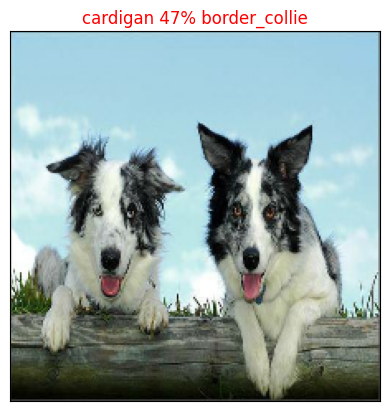

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=169)     # It got this one wrong

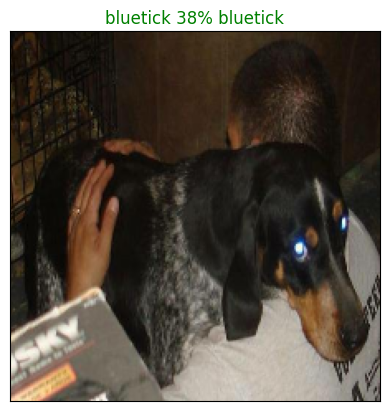

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=69)    # It got this one right

Now we've got one function to visualize our model's top prediction , let's make another to view our model's top 10 predictions  

This function will:
* Take an input of prediction_probabilities array and a ground truth array and integer✅
* Find the prediction using `get_pred_label()`✅
* Find the top 10 :
  * Prediction probabilities indexes✅
  * Prediction probabilities values✅
  * Prediction labels✅
* Plot the top 10 prediction probabilities values and labels, colouring the true label green.✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth table for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]


  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

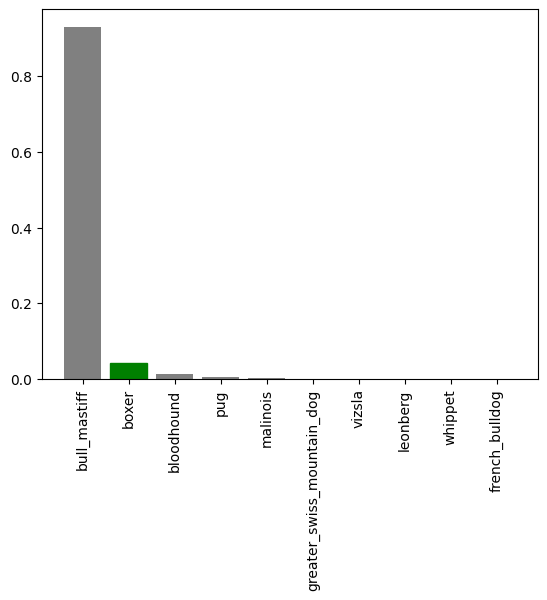

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

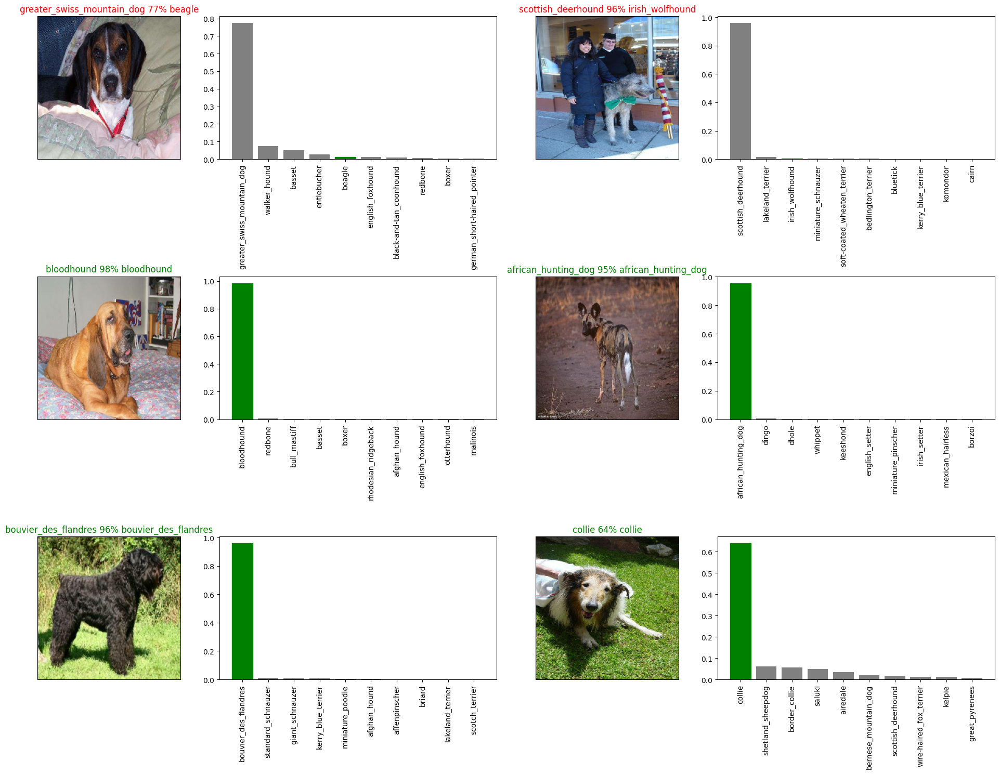

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)      # Changes the padding to horizontal
plt.show()


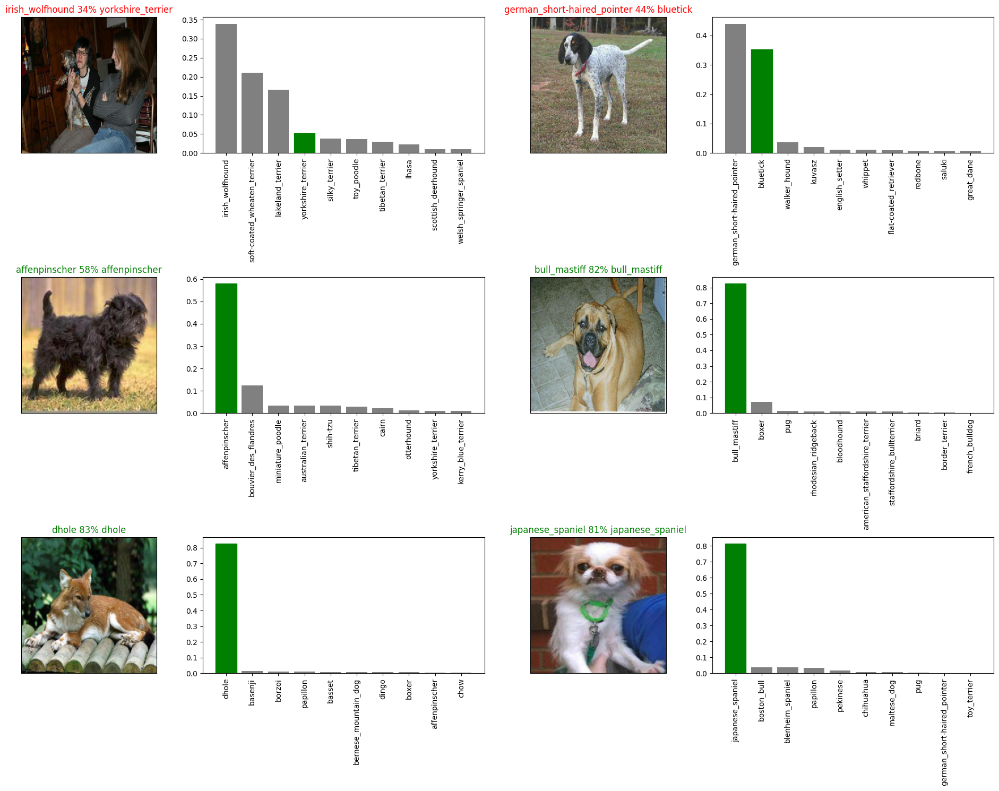

In [ ]:
# Let's check out few other predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)      # Changes the padding to horizontal
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  #Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"  #.h5 is an extension & this altogether is the save format of the model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240517-03061715915218-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240517-03061715915218-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20240516-14581715871486-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20240516-14581715871486-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)


7/7 [==============================] - 10s 1s/step - loss: 1.3208 - accuracy: 0.6100


[1.3207588195800781, 0.6100000143051147]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 13s 2s/step - loss: 1.1795 - accuracy: 0.6550


[1.1795002222061157, 0.6549999713897705]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X) , len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe upto 30 minutes for the first epoch) because the GPU we are using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 592s 2s/step - loss: 1.3330 - accuracy: 0.6738
Epoch 2/100
320/320 [==============================] - 568s 2s/step - loss: 0.4001 - accuracy: 0.8800
Epoch 3/100
320/320 [==============================] - 563s 2s/step - loss: 0.2369 - accuracy: 0.9356
Epoch 4/100
320/320 [==============================] - 563s 2s/step - loss: 0.1532 - accuracy: 0.9644
Epoch 5/100
320/320 [==============================] - 566s 2s/step - loss: 0.1042 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 549s 2s/step - loss: 0.0760 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 555s 2s/step - loss: 0.0596 - accuracy: 0.9910
Epoch 8/100
320/320 [==============================] - 549s 2s/step - loss: 0.0459 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 560s 2s/step - loss: 0.0378 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 576s 2s/step - loss: 0.030

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240517-05531715925192-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20240517-05531715925192-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20240517-05531715925192-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20240517-05531715925192-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).✅
* Make a predictions array by passing the test data batches to the `predict()` method called on our model.✅

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path +fname for fname in os.listdir(test_path)]  # This searches all the filenames in the folder , and then creates a list which shows the path and appends the filename along with it
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/18c9bd6df42e3ae92ffcf815b5c2cc0b.jpg',
 'drive/MyDrive/Dog Vision/test/19166d749759a4089e1f5de14a39d8b1.jpg',
 'drive/MyDrive/Dog Vision/test/190358569b334640fd9c1cbe0638027c.jpg',
 'drive/MyDrive/Dog Vision/test/1919a4618a2887e2549c9d4df2b2c61e.jpg',
 'drive/MyDrive/Dog Vision/test/191acdbc92d6643220bdc61f2dcec643.jpg',
 'drive/MyDrive/Dog Vision/test/191efcb36c7dc501ce72999a6a64a173.jpg',
 'drive/MyDrive/Dog Vision/test/191f5b6e24e8840c3d63e34af1bf2d14.jpg',
 'drive/MyDrive/Dog Vision/test/19229109053a458524736665c38e7042.jpg',
 'drive/MyDrive/Dog Vision/test/19263b69f8be8b1cb21f6c8f69f0957a.jpg',
 'drive/MyDrive/Dog Vision/test/1929a4008c9672f934e3934ddd290dd4.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data btaches... 


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our model and passing it the test data batch will take a long time to run (about an ~1hr).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1824s 6s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.72353450e-12, 2.15459317e-11, 2.58697579e-08, ...,
        2.22999663e-09, 1.51193336e-09, 2.77033479e-10],
       [1.12974220e-10, 1.10975225e-06, 2.71357372e-08, ...,
        2.03032732e-06, 3.43426223e-06, 1.79647552e-09],
       [7.51952575e-06, 1.28385538e-10, 1.85605836e-10, ...,
        5.57013463e-11, 3.93296588e-13, 3.56514080e-13],
       ...,
       [1.20111437e-07, 1.19690867e-07, 6.80145162e-10, ...,
        3.03813721e-07, 3.00978726e-08, 2.16787066e-06],
       [2.15231283e-12, 1.24697128e-11, 2.71537653e-12, ...,
        1.95237977e-08, 7.14522912e-06, 3.62553459e-10],
       [2.00960884e-13, 1.54339635e-14, 1.76277229e-10, ...,
        1.95708519e-10, 5.97124043e-12, 2.22538357e-14]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a Dataframe with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview

To get the data in this format , we'll:
* Create a Pandas Dataframe with an ID column as well as a column for ech dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the dataframe as a csv to submit it to Kaggle.

In [ ]:
# Create a pandas Dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)] # The splitext splits the extension (here '.jpg') from a pathname.
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,18c9bd6df42e3ae92ffcf815b5c2cc0b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,19166d749759a4089e1f5de14a39d8b1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,190358569b334640fd9c1cbe0638027c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1919a4618a2887e2549c9d4df2b2c61e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,191acdbc92d6643220bdc61f2dcec643,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,18c9bd6df42e3ae92ffcf815b5c2cc0b,4.723534e-12,2.154593e-11,2.586976e-08,1.248122e-08,1.470921e-09,8.727842e-11,3.229461e-10,4.560363e-10,3.142170e-11,...,1.753386e-12,6.273200e-09,2.491649e-13,1.036886e-10,1.606782e-10,2.316920e-09,1.412594e-10,2.229997e-09,1.511933e-09,2.770335e-10
1,19166d749759a4089e1f5de14a39d8b1,1.129742e-10,1.109752e-06,2.713574e-08,8.975253e-09,6.785500e-11,9.206607e-08,4.835529e-09,9.470020e-12,1.561671e-10,...,1.751022e-12,2.932421e-09,1.842011e-10,1.694992e-08,3.189583e-07,1.977559e-10,1.583937e-08,2.030327e-06,3.434262e-06,1.796476e-09
2,190358569b334640fd9c1cbe0638027c,7.519526e-06,1.283855e-10,1.856058e-10,5.476817e-07,1.070008e-11,7.125778e-11,7.976723e-10,4.671711e-11,1.128615e-08,...,4.950521e-07,6.209238e-16,2.374529e-13,1.273403e-10,1.562351e-12,2.727122e-11,7.019934e-15,5.570135e-11,3.932966e-13,3.565141e-13
3,1919a4618a2887e2549c9d4df2b2c61e,1.933102e-05,5.284917e-06,2.866784e-07,2.031774e-11,4.368185e-07,7.458591e-11,6.163287e-06,1.985859e-08,2.086007e-07,...,3.088504e-03,5.729236e-05,2.097777e-08,1.985232e-10,5.420520e-09,4.165961e-09,5.370347e-05,1.022966e-07,1.593535e-04,2.587243e-04
4,191acdbc92d6643220bdc61f2dcec643,3.912972e-08,2.603942e-12,2.216805e-09,9.500911e-12,9.582093e-05,1.242590e-06,6.071176e-07,9.996924e-01,1.902449e-08,...,1.068403e-06,2.636828e-05,3.098144e-08,1.014762e-07,2.449934e-10,8.726391e-09,1.488994e-07,5.773010e-09,8.973292e-07,4.601378e-10


In [ ]:
# Save our predictions DataFrame to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on Custom Images

To make predictions on custom images , we'll:
* Get the filepaths of our own images.
* Turn the filepaths into Data Batches using `create_data_batches()`. And since our custom images won't have labels we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/Policepuppy.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/corgiaf.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/Moonwalker.jpg']

In [ ]:
# Turn custom images into Batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data btaches... 


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 404ms/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['doberman', 'pembroke', 'siberian_husky']

In [ ]:
# Get the custom images ( our unbatchify() function won't work since there aren't labels...maybe we could fix that later)
custom_images = []
# Loop through the unbatched data
# So we create an empty list , we are unbatching our batched custom dataset , returning it to an iterator and appending each image to custom images
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

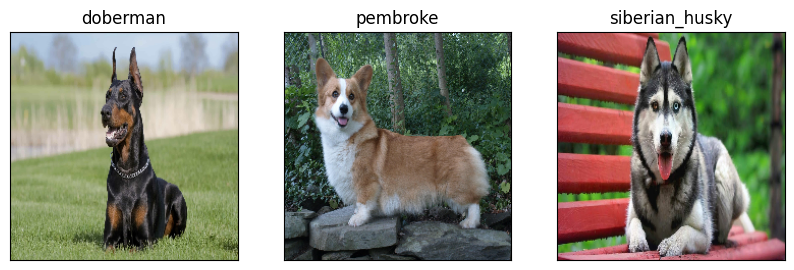

In [ ]:
# Check custom predictions
plt.figure(figsize=(10,10))

for i,image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)